In [ ]:
#!pip install Mne
#!pip install AutoReject

Instructuions:
1. Install any of the above libraries if you don't have them already installed
2. To view the preprocessing of one participants, you can simply look at all cells up to *last_cell_preprocess*
3. To run the analysis final statistical analysis run all cells below *first_statistical_cell*, you might need to change the variables in the figures to visualise the results of the tests depedning on which data you are testing for i.e. evoked or epoched differences.
Notes:
1. Because we had issues during data collection with participants 0002,0003,0004 you can see that they undergo some re-ordering and re-naming of their channels initially
2. Raw data could not be provided as we cannot upload large files to github

In [1]:
import mne
mne.set_log_level('error')

import numpy as np
import matplotlib.pyplot as plt
participant_ids = ['0008']
raw_data_dict = {}
for participant_id in participant_ids:
    filename = f'sub{participant_id}.vhdr'
    raw_data_dict[participant_id] = mne.io.read_raw_brainvision(filename,preload=True)

In [ ]:
participant_to_process = '0008'
montage_file = r'C:\Users\Iacovos\Documents\NeuraSearch\PsychologyFinalProject\Data\Cap\BC-MR3-64.bvef'
braincap_mr_montage = mne.channels.read_custom_montage(montage_file)
if participant_to_process in ['0002','0003','0004']:
    channel_mapping_correction = {}
    wrong_channel_names = list(raw_data_dict['0002'].info['ch_names'])
    correct_channel_names = list(raw_data_dict['0004'].info['ch_names'])
    for channel_index in range(len(wrong_channel_names)):
        wrong_channel_name = wrong_channel_names[channel_index]
        correct_channel_name = correct_channel_names[channel_index]
        channel_mapping_correction[wrong_channel_name] = correct_channel_name
    raw_data_dict['0002'].rename_channels(channel_mapping_correction)
    raw_data_dict['0002'].set_montage(braincap_mr_montage)
    incorrect_channel_order = raw_data_dict['0002'].info['ch_names']
    correct_channel_order = incorrect_channel_order[32:64] + incorrect_channel_order[0:32]
    raw_data_dict['0002'].reorder_channels(correct_channel_order)
    raw_data_dict['0002'].drop_channels('ECG')

In [3]:
if participant_process == '0003':
    raw_data_dict['0003'].rename_channels(channel_mapping_correction)
    raw_data_dict['0003'].set_montage(braincap_mr_montage)
    raw_data_dict['0003'].reorder_channels(correct_channel_order)
    raw_data_dict['0003'].drop_channels('ECG')
elif participant_process == '0004':
    raw_data_dict['0004'].reorder_channels(correct_channel_order)
    raw_data_dict['0004'].drop_channels('ECG')
else:
    raw_data_dict[participant_process].drop_channels('ECG')



<RawBrainVision | sub0008.eeg, 63 x 8916200 (1783.2 s), ~4.19 GB, data loaded>

In [4]:
def extract_lines(input_file):
    with open(input_file, 'r') as file:
        lines = file.readlines()
    counter = 2
    lines_with_counters = []
    for line in lines:
        if 'scenario: text' in line or "'eeg_trigger': 'irrelevant'" in line or "'eeg_trigger': 'relevant'" in line:
            lines_with_counters.append(f"{line.strip()} - counter: {counter}")
            counter += 1

    with open(input_file +'_output.txt', 'w') as output_file:
        for line in lines_with_counters:
            output_file.write(line + '\n')

def extract_important_counters(text_file):
    stimuli_positions = []
    with open(text_file, 'r') as file:
        lines = file.readlines()
    for line in lines:
        if 'scenario' in line or 'important' in line:
            parts = line.split('-')
            counter_part = [part.strip() for part in parts if 'counter:' in part]
            if counter_part:
                important_counter = counter_part[0].split(':')[-1].strip()
                stimuli_positions.append(important_counter)
    return np.array(stimuli_positions, dtype=int)

In [ ]:
raw_data_dict[participant_to_process].plot(start=500,duration=500, proj=False, n_channels=len(raw_data_dict[participant_to_process].ch_names), remove_dc=False);
raw_data_dict[participant_to_process].describe()

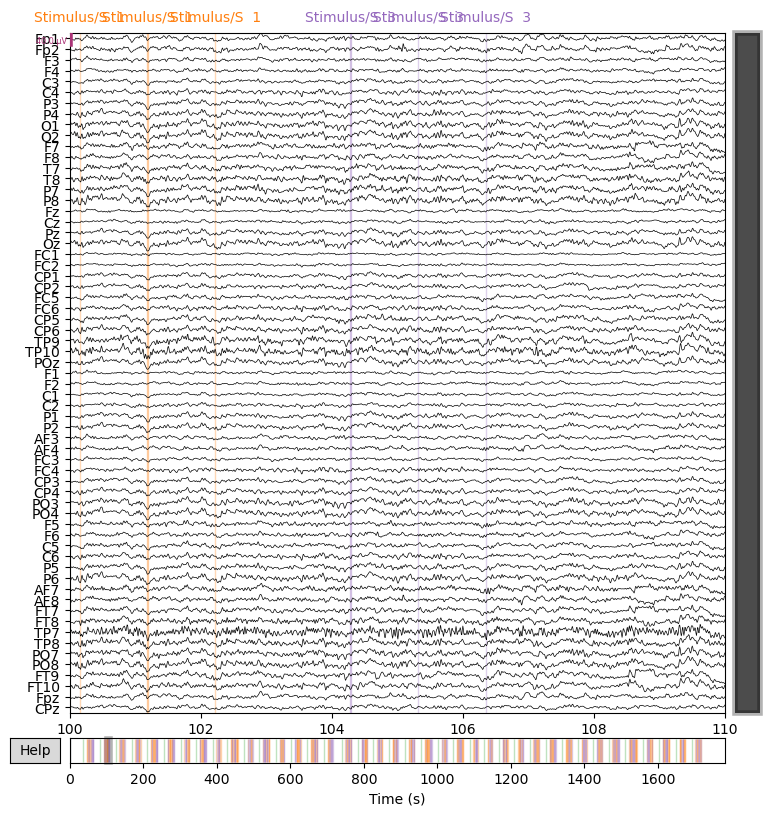

In [6]:
low_cut = 1
high_cut = 30
raw_filtered = raw_data_dict[participant_to_process].copy().filter(l_freq=low_cut, h_freq=high_cut)
raw_downsampled = raw_filtered.copy().resample(sfreq=250)
raw_downsampled.plot(start=100,duration=10, proj=False, n_channels=len(raw_data_dict[participant_to_process].ch_names), remove_dc=False);

In [18]:
# Break raw data into 1 s epochs
tstep = 1.0
events_ica = mne.make_fixed_length_events(raw_downsampled, duration=tstep)
epochs_ica = mne.Epochs(raw_downsampled, events_ica,
                        tmin=0.0, tmax=tstep,
                        baseline=None,
                        preload=True)

In [ ]:
from autoreject import AutoReject

ar = AutoReject(n_interpolate=[1, 2, 4],
                random_state=42,
                picks=mne.pick_types(epochs_ica.info, 
                                     eeg=True,
                                     eog=False
                                    ),
                n_jobs=-1, 
                verbose=False
                )

ar.fit(epochs_ica)

reject_log = ar.get_reject_log(epochs_ica)

In [ ]:
fig, ax = plt.subplots(figsize=[15, 5])
reject_log.plot('horizontal', ax=ax, aspect='auto')
plt.show()

In [ ]:
random_state = 42   
ica_n_components = .99 


ica = mne.preprocessing.ICA(n_components=ica_n_components,
                            random_state=random_state,
                            )
ica.fit(epochs_ica[~reject_log.bad_epochs], decim=3)

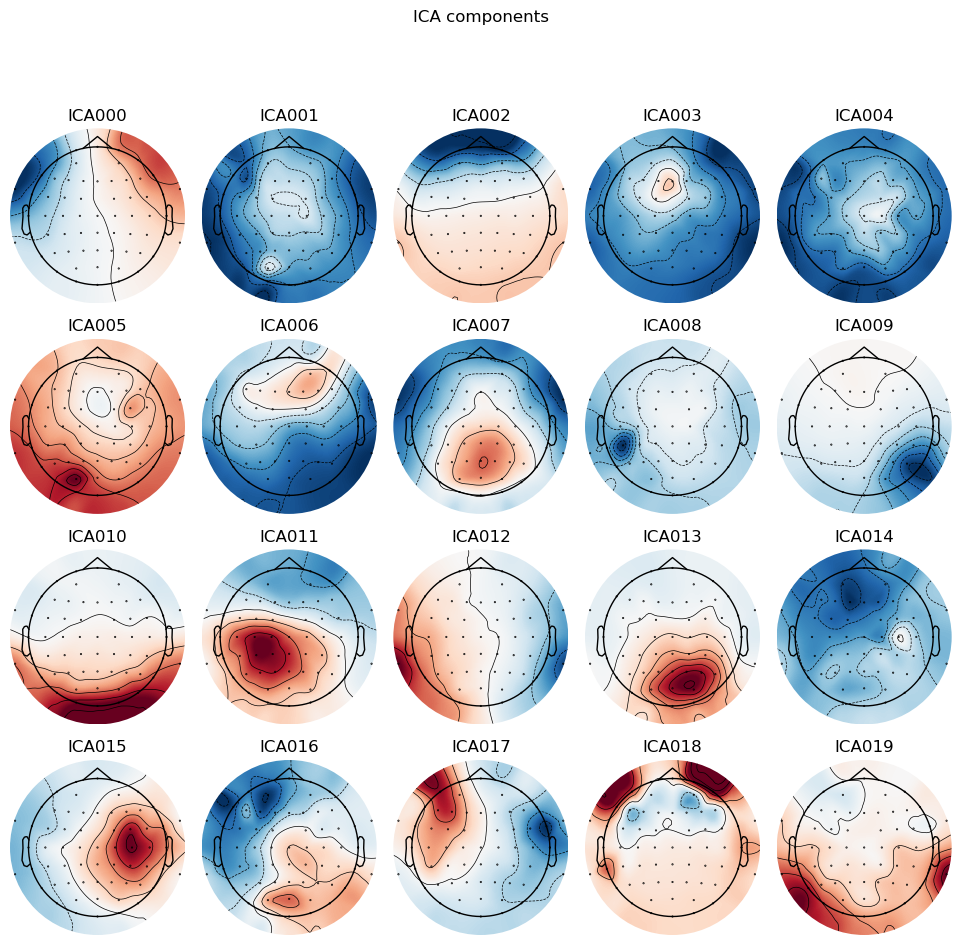

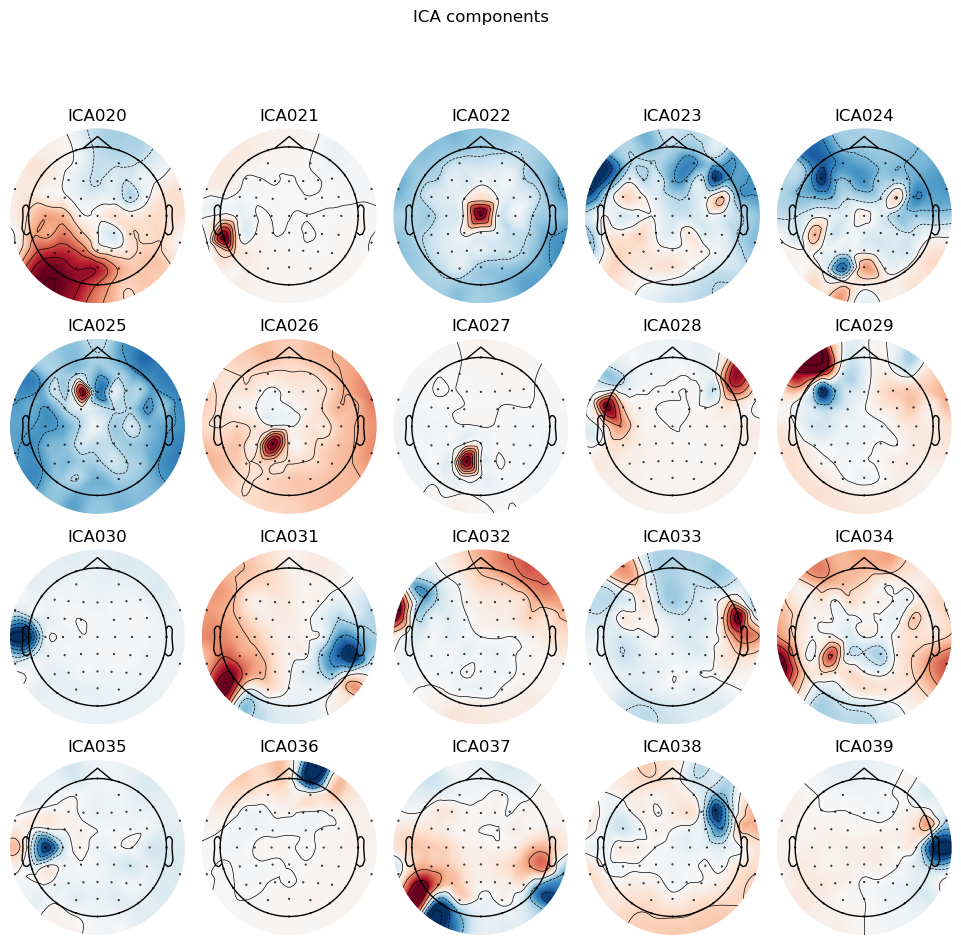

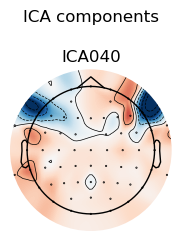

In [10]:
ica.plot_components();

C:\Users\Iacovos\anaconda3\envs\mne\Lib\site-packages\mne\viz\ica.py:166: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


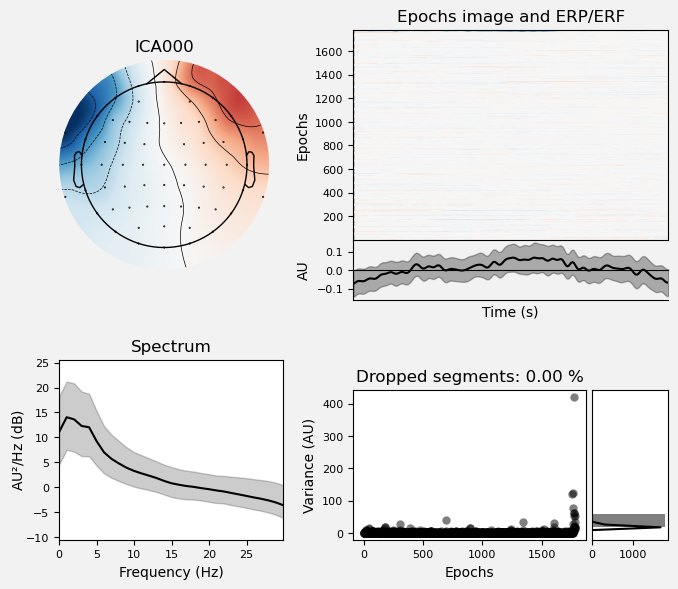

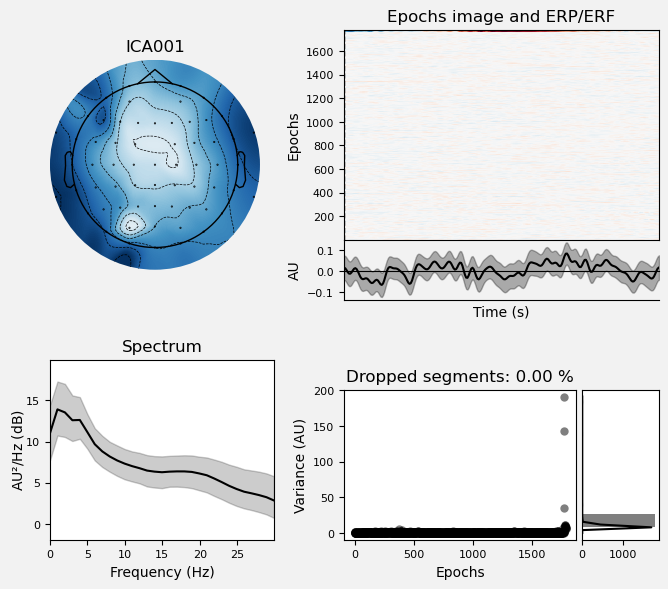

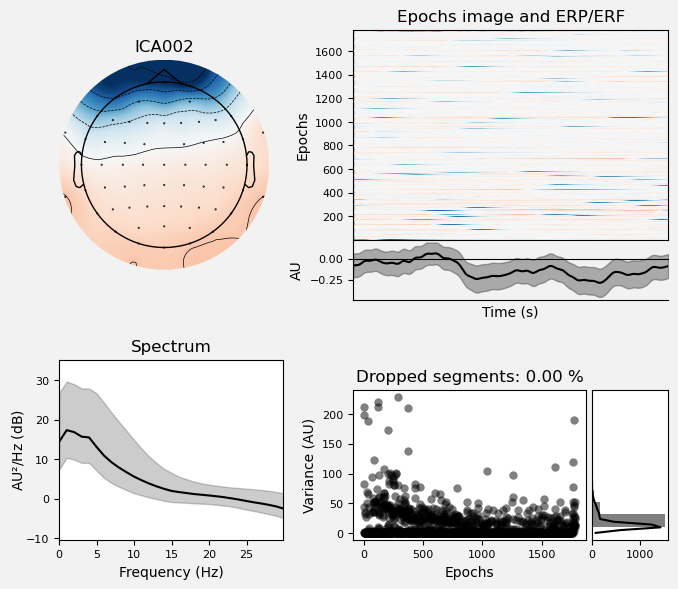

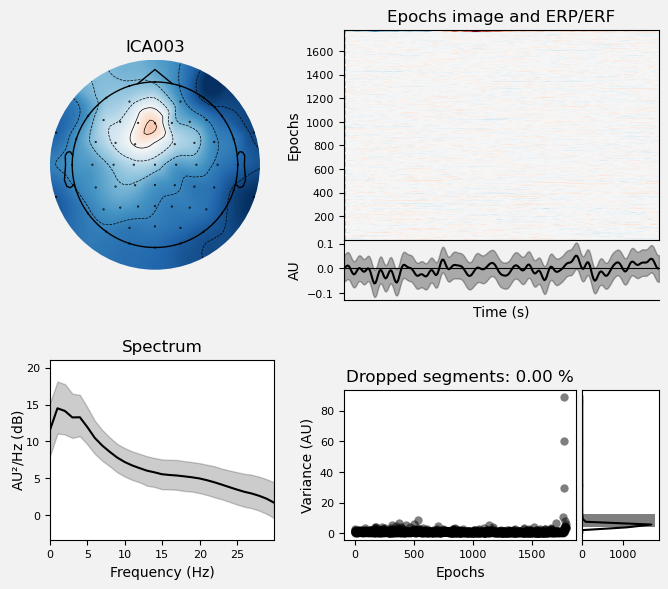

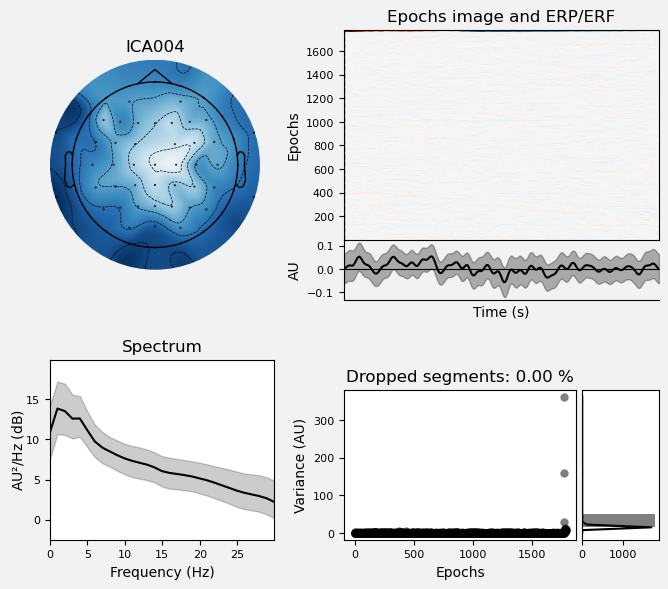

...

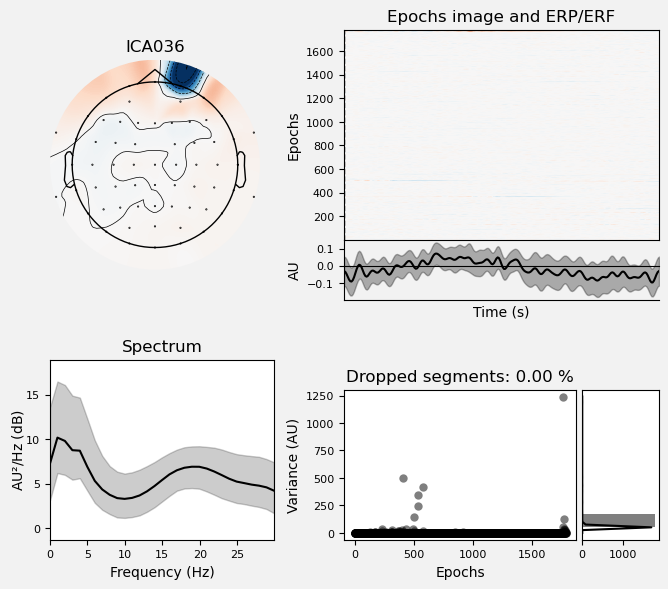

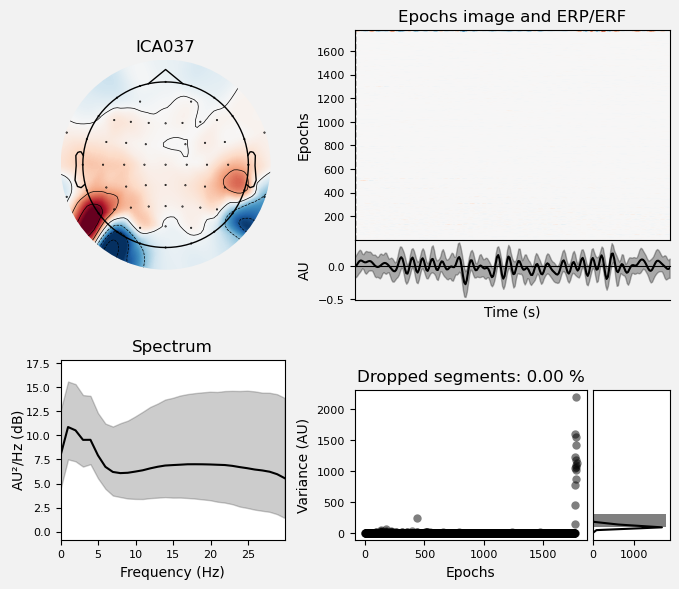

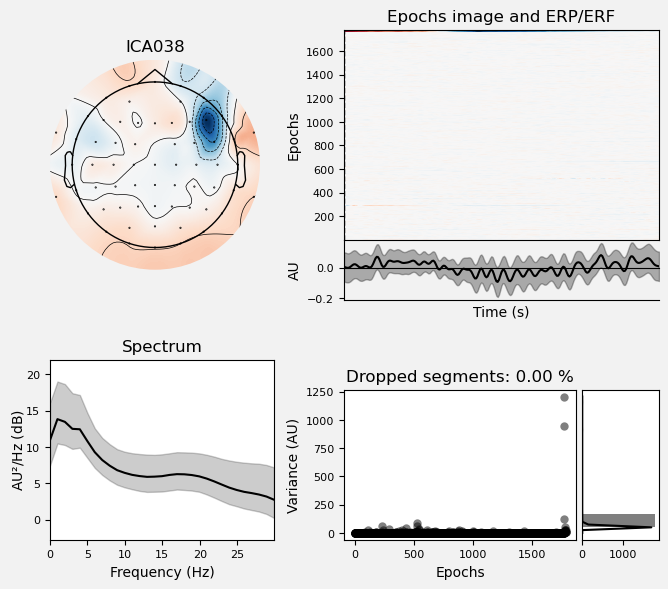

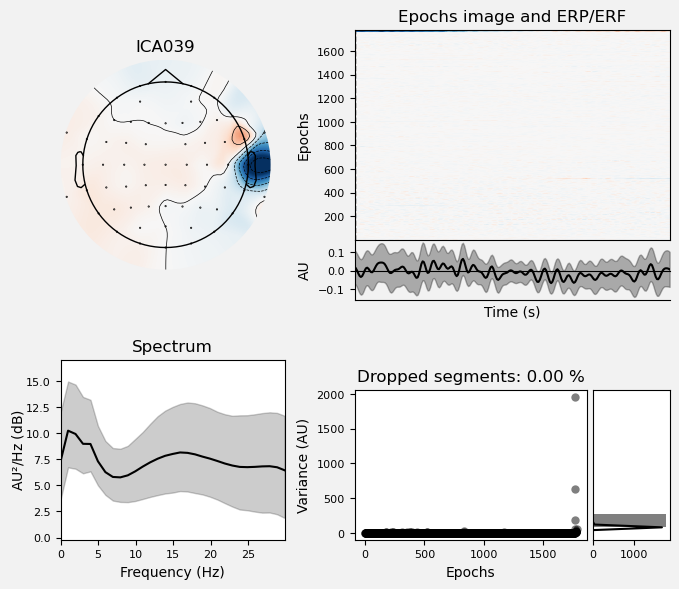

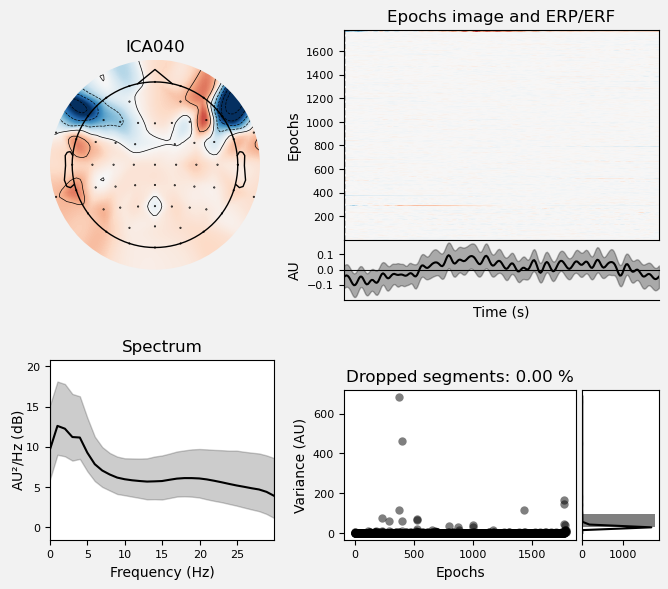

In [11]:
 ica.plot_properties(epochs_ica, picks=range(0, ica.n_components_), psd_args={'fmax': high_cut});

In [ ]:
ica.exclude = []
num_excl = 0
max_ic = 2
z_thresh = 3.5
z_step = .05

while num_excl < max_ic:
    eog_indices, eog_scores = ica.find_bads_eog(epochs_ica,
                                                ch_name=['Fp1', 'Fp2', 'F7', 'F8'], 
                                                threshold=z_thresh
                                                )
    num_excl = len(eog_indices)
    z_thresh -= z_step 

ica.exclude = eog_indices

print('Final z threshold = ' + str(round(z_thresh, 2)))

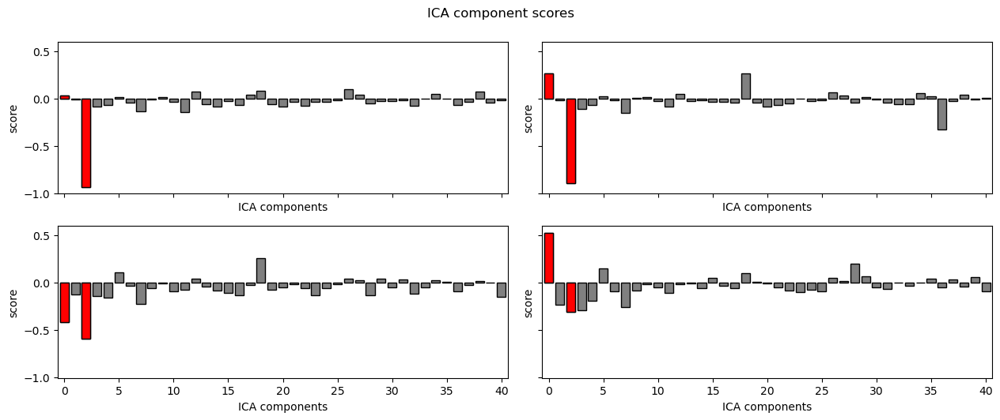

In [13]:
ica.plot_scores(eog_scores);

In [ ]:
ica.save(participant_to_process + '_ica.fif', overwrite=True);

In [7]:
file_path_to_extract = r"C:\Users\Iacovos\Documents\NeuraSearch\PsychologyFinalProject\Data\0008_psycho_py.log"
file_to_get_counters_from = r"C:\Users\Iacovos\Documents\NeuraSearch\PsychologyFinalProject\Data\PsychoPyFiles\0008_output.txt"
#extract_lines(file_path_to_extract)
important_stimuli_indexes = extract_important_counters(file_to_get_counters_from)
len(important_stimuli_indexes)
print(important_stimuli_indexes)

[  2   5   6  12  13  18  20  24  27  28  31  34  35  40  42  44  47  48
  54  55  57  60  65  68  69  73  75  80  84  85  89  91  92  97  98 101
 103 107 110 113 117 119 121 122 126 127 131 135 136 143 144 146 148 151
 153 155 157 160 165 168 171 173 176 179 180 182 183 189 193 194 196 199
 203 204 210 212 214 216 218 219 224 226 230 231 237 239 241 243 248 251
 252 254 256 260 263 264 267 269 273 274 277 280 283 284 288 290 294 299
 302 303 307 309 311 314 315 318 321 324 326 332 333 335 337 338 341 344
 346 347 350 353 354 356 358 361 366 367 370 373 374 377 379 382 383 389
 392 393 396 401 403 405 408 412 413 415 421 422 424 425 430 431 434 435
 440 442 446 447 450 452 457 458 463 466 471 472 481 482 484 486 491 494
 495 497 502 505 511 512 516 518 519 525 526 528 532 533 539]


In [377]:
participant_annotation = True

In [9]:
events, events_dict = mne.events_from_annotations(raw_downsampled)
if participant_annotation == True:
    events_copy = events.copy()
    #events_copy = events_copy[6:]
    print(events_copy[:10])
    events_participant_annotated = events_copy[important_stimuli_indexes]
    print(events_participant_annotated[:10])

event_mapping = {'Rel': 1,'SilRec': 2, 'NonRel': 3}
event_mapping = {v:k for k,v in event_mapping.items()}
event_id = {}

for key, value in events_dict.items():
    if 'Stimulus/S' in key:
        orig_event_code = int(key.split('/S')[1])
        event_id[event_mapping[orig_event_code]] = value
event_id      

[[    0     0 99999]
 [    0     0 10001]
 [ 8922     0     2]
 [11442     0     1]
 [11701     0     1]
 [11962     0     1]
 [12480     0     3]
 [12743     0     3]
 [13004     0     3]
 [13262     0     1]]
[[ 8922     0     2]
 [11962     0     1]
 [12480     0     3]
 [14300     0     3]
 [14818     0     3]
 [20451     0     2]
 [23229     0     3]
 [24521     0     3]
 [25554     0     1]
 [26071     0     3]]


{'Rel': 1, 'SilRec': 2, 'NonRel': 3}

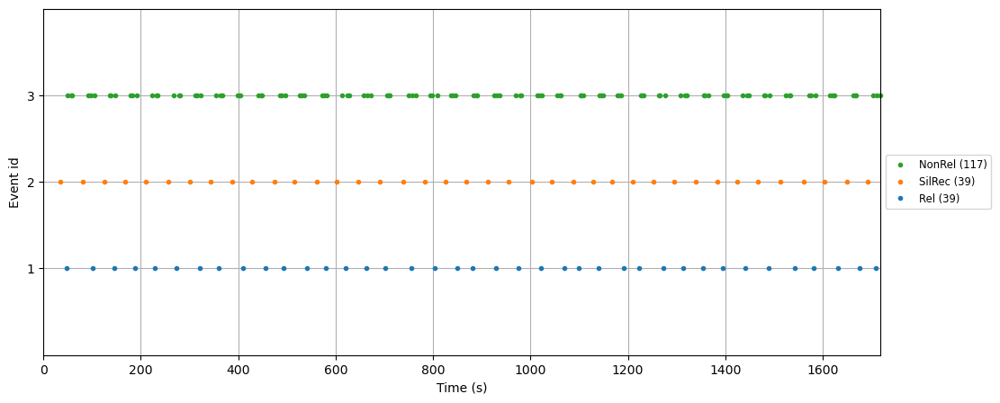

In [10]:
fig, ax = plt.subplots(figsize=[15, 5])
if participant_annotation == True:
    mne.viz.plot_events(events_participant_annotated, raw_downsampled.info['sfreq'],  
                        event_id=event_id,                    
                        axes=ax);
else:
    mne.viz.plot_events(events, raw_downsampled.info['sfreq'],  
                        event_id=event_id,                    
                        axes=ax);
plt.show();

In [11]:
tmin =  -.100  
tmax =  .950  
baseline = (None, 0)
reject = dict(eeg=100e-6)
if participant_annotation == True: 
    epochs = mne.Epochs(raw_downsampled,
                        events_participant_annotated, event_id,
                        tmin, tmax,
                        baseline=baseline, 
                        preload=True,
                        reject=reject
                       )
else:
    epochs = mne.Epochs(raw_downsampled,
                    events, event_id,
                    tmin, tmax,
                    baseline=baseline, 
                    preload=True,
                    reject=reject
                   )

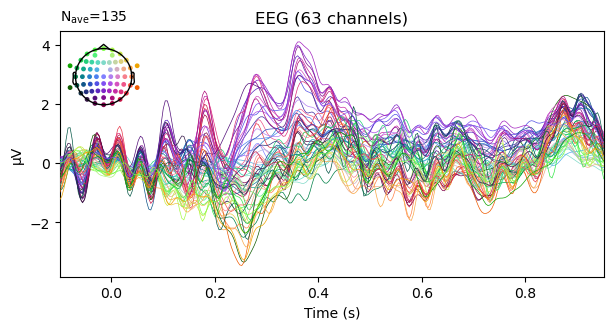

In [12]:
epochs['Rel', 'NonRel'].average().plot(); 

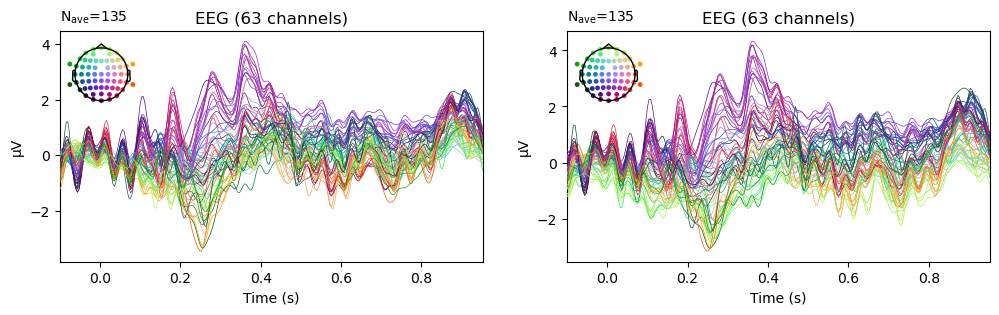

In [13]:
ica = mne.preprocessing.read_ica(participant_to_process + '_ica.fif')
epochs_postica = ica.apply(epochs.copy())
fig, ax = plt.subplots(1, 2, figsize=[12, 3])
epochs['Rel', 'NonRel'].average().plot(axes=ax[0], ylim=[-11, 10], show=False); 
epochs_postica['Rel', 'NonRel'].average().plot(axes=ax[1], ylim=[-11, 10]);

In [14]:
from autoreject import AutoReject

ar = AutoReject(n_interpolate=[1, 2, 4],
                random_state=42,
                picks=mne.pick_types(epochs.copy().info, 
                                     eeg=True,
                                     eog=False
                                    ),
                n_jobs=-1, 
                verbose=False
                )

epochs_clean, reject_log_clean = ar.fit_transform(epochs_postica, return_log=True)
reject_log_clean.save(participant_to_process + '_reject_log.npz', overwrite=True)
epochs_clean

Number of events,162
Events,NonRel: 102Rel: 32SilRec: 28
Time range,-0.100 – 0.952 s
Baseline,-0.100 – 0.000 s


In [15]:
from autoreject import read_reject_log
read_reject_log(participant_to_process + '_reject_log.npz')

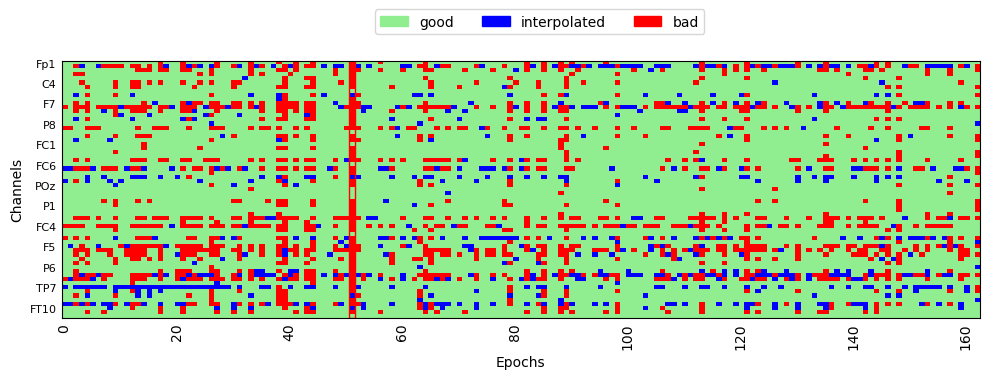

In [16]:
fig, ax = plt.subplots(figsize=[10, 4])
reject_log_clean.plot('horizontal', aspect='auto', ax=ax)
plt.show()

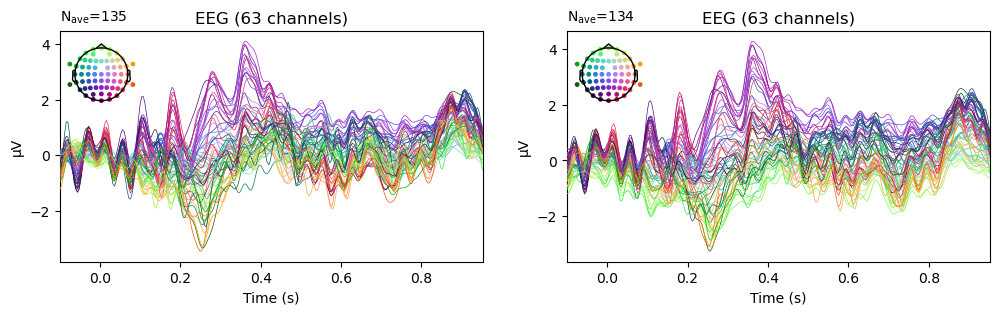

In [17]:
fig, ax = plt.subplots(1, 2, figsize=[12, 3])

epochs['Rel', 'NonRel'].average().plot(axes=ax[0], show=False); 
epochs_clean['Rel', 'NonRel'].average().plot(axes=ax[1]);

In [ ]:
# Specify times to plot at, as [min],[max],[stepsize]
times = np.arange(0, tmax, 0.1)

print('Rel')
epochs_clean['Rel'].average().plot_topomap(times=times, average=0.050, vlim=(-8, 8));

print('NonRel')
epochs_clean['NonRel'].average().plot_topomap(times=times, average=0.050, vlim=(-8, 8));

The cell below is the last cell to run, to preprocess the data of a single participant

In [18]:
#last_cell_preprocess
if participant_annotation == True:
    epochs_clean.save(participant_to_process + '_annotated_epo.fif', overwrite=True)
else:
    epochs_clean.save(participant_to_process + '_epo.fif', overwrite=True)

In [448]:
#first_statistical_cell
import mne
mne.set_log_level('error')
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from mne.stats import spatio_temporal_cluster_1samp_test, ttest_1samp_no_p
from functools import partial
montage_file = r'C:\Users\Iacovos\Documents\NeuraSearch\PsychologyFinalProject\Data\Cap\BC-MR3-64.bvef'
braincap_mr_montage = mne.channels.read_custom_montage(montage_file)

folder_path = ''
epoch_pattern='*_annotated_epo.fif'
participant_ids = ['0002','0003','0004','0005','0006','0007','0008']
epoch_files = glob.glob(os.path.join(folder_path, epoch_pattern))
epoch_dict = {}

evoked_diff = {'Rel':[], 'NonRel':[]}
for index, file in enumerate(epoch_files):
    participant_id = participant_ids[index]
    epoch_dict[participant_id] = mne.read_epochs(file, preload=True).set_montage(braincap_mr_montage)
    if participant_id in ['0002','0003','0004']:
        wrong_channel_names = epoch_dict[participant_id].ch_names
        correct_channel_names = wrong_channel_names[32:63] + wrong_channel_names[0:32]
        channel_mapping_correction={}
        for channel_index in range(len(wrong_channel_names)):
            wrong_channel_name = wrong_channel_names[channel_index]
            correct_channel_name = correct_channel_names[channel_index]
            channel_mapping_correction[wrong_channel_name] = correct_channel_name
        epoch_dict[participant_id].rename_channels(channel_mapping_correction)
        
    channel_names = epoch_dict['0002']['NonRel'].ch_names
    channel_dict = {channel: 'eeg' for channel in channel_names}
    epoch_dict[participant_id].set_channel_types(channel_dict)
    evokeds_pariticipant = {c:epoch_dict[participant_id][c].average() for c in conditions}
    evoked_diff['Rel'].append(evokeds_pariticipant['Rel'])
    evoked_diff['NonRel'].append(evokeds_pariticipant['NonRel'])
 
diff_waves = [mne.preprocessing.compute_current_source_density(mne.combine_evoked([evoked_diff['NonRel'][subj], 
                                evoked_diff['Rel'][subj]
                                ],
                                weights=[1, -1]
                                ) , copy=True)
            for subj in range(len(participant_ids))
            ]

time_win = (.100, .950)

differences_evoked = np.array([np.mean(e.get_data( 
                                 tmin=time_win[0], 
                                 tmax=time_win[1]
                                 ),
                      axis=1) 
              for e in diff_waves
              ]
             )


reshaped_differences_evoked = np.swapaxes(np.array([e.get_data() 
                          for e in diff_waves
                          ]
                         ),
                1, 2
                )
reshaped_differences_evoked.shape


(7, 264, 63)

In [425]:
from mne.decoding import Scaler
import random
def generate_random_list(length, upper_limit):
    random.seed(42)
    return [random.randint(0, upper_limit) for _ in range(length)]
    
folder_path = ''
epoch_pattern='*_annotated_epo.fif'
participant_ids = ['0002','0003','0004','0005','0006','0007','0008']
epoch_files = glob.glob(os.path.join(folder_path, epoch_pattern))
epoch_dict = {}
csd_epoch_dict = {}
epochs_to_analyse = {}
for index, file in enumerate(epoch_files):
    participant_id = participant_ids[index]
    epoch_dict[participant_id] = mne.read_epochs(file, preload=True).set_montage(braincap_mr_montage)
    print(f"Participant {participant_id}, beginning epochs {epoch_dict[participant_id]}")
    if participant_id in ['0002','0003','0004']:
        wrong_channel_names = epoch_dict[participant_id].ch_names
        correct_channel_names = wrong_channel_names[32:63] + wrong_channel_names[0:32]
        channel_mapping_correction={}
        for channel_index in range(len(wrong_channel_names)):
            wrong_channel_name = wrong_channel_names[channel_index]
            correct_channel_name = correct_channel_names[channel_index]
            channel_mapping_correction[wrong_channel_name] = correct_channel_name
        epoch_dict[participant_id].rename_channels(channel_mapping_correction)
        
    channel_names = epoch_dict['0002']['NonRel'].ch_names
    channel_dict = {channel: 'eeg' for channel in channel_names}
    epoch_dict[participant_id].set_channel_types(channel_dict)
    
    number_of_relevant_events = len(epoch_dict[participant_id]['Rel'])
    number_of_irrelevant_events = len(epoch_dict[participant_id]['NonRel'])-1
    random_nonrel_epochs_to_keep = generate_random_list(number_of_relevant_events,number_of_irrelevant_events)
    
    epochs_to_analyse[participant_id] = {}
    epochs_to_analyse[participant_id]['Rel'] = epoch_dict[participant_id]['Rel'].copy()
    epochs_to_analyse[participant_id]['NonRel'] = mne.concatenate_epochs([epoch_dict[participant_id]['NonRel'][i] for i in random_nonrel_epochs_to_keep])
    
    print(f"Participant {participant_id}, remaining relevant epochs {epochs_to_analyse[participant_id]['Rel']}, remaining non-relevant epochs {epochs_to_analyse[participant_id]['NonRel']}")

epoch_differences = []
for participant, participant_data in epochs_to_analyse.items():
        for epoch_index in range(len(participant_data['Rel'])):
            
            difference = mne.combine_evoked([participant_data['NonRel'][epoch_index].average(), 
                                            participant_data['Rel'][epoch_index].average()], weights=[1, -1])
            
            difference_csd = mne.preprocessing.compute_current_source_density(difference, copy=True)
            
            epoch_differences.append(difference_csd)

reshaped_differences = np.swapaxes(np.array([e.get_data() 
                          for e in epoch_differences
                          ]
                         ),
                1, 2
                )
print(epoch_differences[0].get_data().shape)

Participant 0002, beginning epochs <EpochsFIF |  97 events (all good), -0.1 – 0.952 s, baseline -0.1 – 0 s, ~12.4 MB, data loaded,
 'Rel': 29
 'SilRec': 13
 'NonRel': 55>
Participant 0002, remaining relevant epochs <EpochsFIF |  29 events (all good), -0.1 – 0.952 s, baseline -0.1 – 0 s, ~3.8 MB, data loaded,
 'Rel': 29>, remaining non-relevant epochs <EpochsArray |  29 events (all good), -0.1 – 0.952 s, baseline -0.1 – 0 s, ~3.8 MB, data loaded,
 'NonRel': 29>
Participant 0003, beginning epochs <EpochsFIF |  148 events (all good), -0.1 – 0.952 s, baseline -0.1 – 0 s, ~18.9 MB, data loaded,
 'Rel': 36
 'SilRec': 23
 'NonRel': 89>
Participant 0003, remaining relevant epochs <EpochsFIF |  36 events (all good), -0.1 – 0.952 s, baseline -0.1 – 0 s, ~4.6 MB, data loaded,
 'Rel': 36>, remaining non-relevant epochs <EpochsArray |  36 events (all good), -0.1 – 0.952 s, baseline -0.1 – 0 s, ~4.6 MB, data loaded,
 'NonRel': 36>
Participant 0004, beginning epochs <EpochsFIF |  157 events (all good

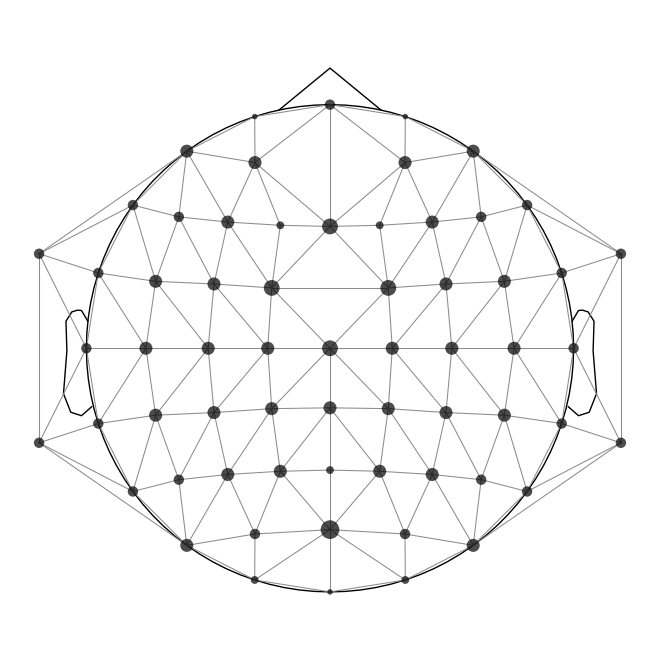

In [9]:
from mne.channels import find_ch_adjacency
adjacency, ch_names = find_ch_adjacency(epoch_differences[150].info, ch_type='eeg')
mne.viz.plot_ch_adjacency(epoch_differences[150].info, adjacency, ch_names=ch_names);

In [431]:
n_perm = 1e4
sigma = 1e-3
threshold_tfce = dict(start=0, step=0.2)
stat_fun_hat = partial(ttest_1samp_no_p, sigma=sigma)
t_tfce, clusters_tfce, cluster_pv_tfce, H0_tfce = spatio_temporal_cluster_1samp_test( 
    reshaped_differences, 
    threshold=threshold_tfce,
    adjacency=adjacency,
    n_permutations=n_perm, 
    out_type='mask',
    stat_fun=stat_fun_hat,
    n_jobs=-1,  
    verbose='Info'
    )

stat_fun(H1): min=-6.202226 max=4.901667
Running initial clustering …
Using 32 thresholds from 0.00 to 6.20 for TFCE computation (h_power=2.00, e_power=0.50)


C:\Users\Iacovos\AppData\Local\Temp\ipykernel_31608\903787011.py:5: RuntimeWarning: Provided stat_fun does not treat variables independently. Setting buffer_size to None.
  t_tfce, clusters_tfce, cluster_pv_tfce, H0_tfce = spatio_temporal_cluster_1samp_test(


Found 16632 clusters


  0%|          | Permuting : 0/9999 [00:00<?,       ?it/s]

In [325]:
t_tfce_diff, clusters_tfce_diff, cluster_pv_tfce_diff, H0_tfce_diff = spatio_temporal_cluster_1samp_test( 
    reshaped_differences_evoked, 
    threshold=threshold_tfce,
    adjacency=adjacency,
    n_permutations=n_perm, 
    out_type='mask',
    #stat_fun=stat_fun_hat,
    n_jobs=-1, 
    verbose='Info'
    )

stat_fun(H1): min=-19.488824 max=16.247074
Running initial clustering …
Using 98 thresholds from 0.00 to 19.40 for TFCE computation (h_power=2.00, e_power=0.50)
Found 16632 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

(264, 63)
2676 points selected by TFCE ...


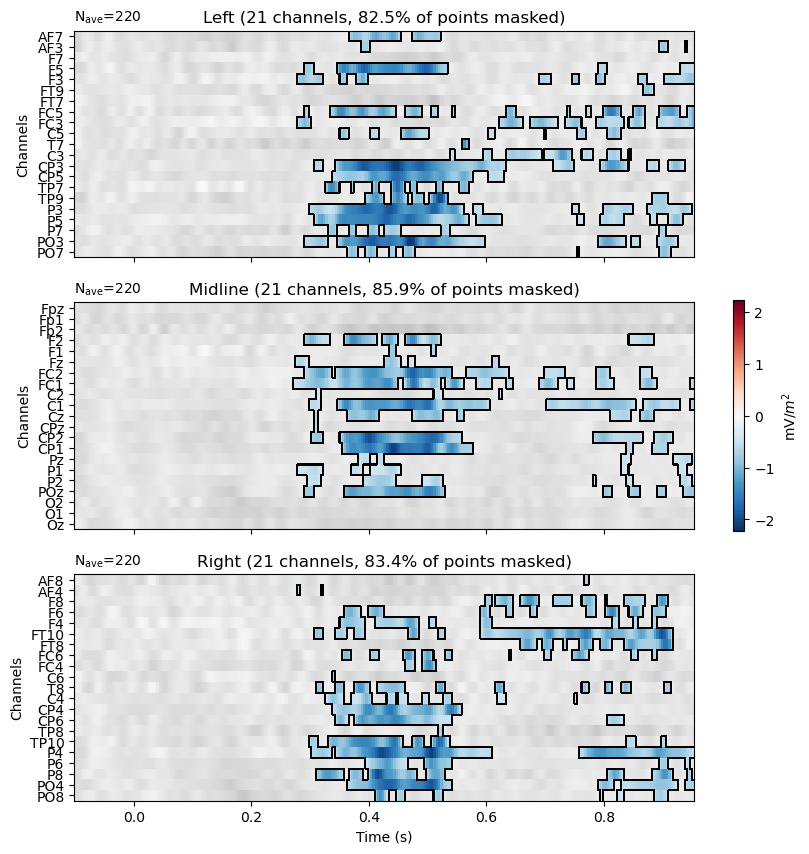

In [454]:
from mne.channels import make_1020_channel_selections
mask = cluster_pv_tfce.reshape(t_tfce.shape).T < .05
print(cluster_pv_tfce.reshape(t_tfce.shape).shape)
print(str(mask.sum()) + " points selected by TFCE ...")
selections = make_1020_channel_selections(epoch_differences[120].info, midline="12z")
time_unit = dict(time_unit="s")
fig, axes = plt.subplots(nrows=3, figsize=(10, 10))
axes = {sel: ax for sel, ax in zip(selections, axes.ravel())}
mne.grand_average(epoch_differences).plot_image(axes=axes,
                            group_by=selections,
                            colorbar=False,
                            show=False,
                            mask=mask,
                            show_names='all',
                            titles=None,
                            **time_unit
                            );
plt.colorbar(axes["Left"].images[-1], ax=list(axes.values()), shrink=0.3,label='mV/$m^2$');
plt.savefig('tfce_colorbar_epo.png')
plt.show();

In [437]:
def plot_p_values(p_values,time,fname):
    evoked = mne.EvokedArray(-np.log10(p_values)[:, np.newaxis], epochs_to_analyse['0005']['NonRel'].info,tmin=time)
    mask = p_values[:, np.newaxis] <= 0.05
    
    evoked.plot_topomap(
        ch_type="eeg",
        scalings=1,
        times=time,
        time_format=None,
        vlim=(0.0, np.max),
        units="-log10(p)",
        cbar_fmt="-%0.1f",
        mask=mask,
        size=3,
        show_names=True,
        time_unit="s",
    )
    plt.savefig(fname)
def calculate_effect_sizes(electrode_indexes,data):
    selected_electrodes = data[:, electrode_indexes]
    electrode_means = np.mean(selected_electrodes, axis=0)
    elctrode_stds = np.std(selected_electrodes, axis=0)
    cohends = electrode_means/elctrode_stds
    return cohends, electrode_means, elctrode_stds
                                                        

In [438]:
from mne.stats import permutation_t_test
time_window_pairs = [(.300,.500), (.800,.850)]
p_value_array = []
for time_pair in time_window_pairs:
    np_epoch_differences = np.array([np.mean(e.get_data(
                                     tmin=time_pair[0], 
                                     tmax=time_pair[1]
                                     ),
                          axis=1) 
                  for e in epoch_differences
                  ]
                 )
    T0, p_values, H0 = permutation_t_test(np_epoch_differences, 10000, n_jobs=None)
    p_value_array.append(p_values)
    significant_sensors = np.where(p_values <= 0.05)
    significant_p_values = p_values[p_values <= 0.05]
    significant_sensors_names = np.array(ch_names)[significant_sensors[0]]
    significant_t_statistic = T0[significant_sensors[0]]
    effect_sizes,means,stds = calculate_effect_sizes(significant_sensors[0], np_epoch_differences)
    if len(significant_sensors_names) != 0:
        print(f"\nSignificant electrodes for time window {time_pair[0]} - {time_pair[1]}\n")
        for index,sensor_name in enumerate(significant_sensors_names):
            print(f"Electrode {sensor_name} with p-value {significant_p_values[index]}, t-statistic {significant_t_statistic[index]}, effect size {effect_sizes[index]}, mean {means[index]} and SD {stds[index]} ")


Significant electrodes for time window 0.3 - 0.5

Electrode Fp2 with p-value 0.0001, t-statistic 4.822137081813034, effect size 0.3258498269947288, mean 0.0013908480078213645 and SD 0.004268371171619078 
Electrode P3 with p-value 0.0001, t-statistic -5.186550960315112, effect size -0.3504746348858671, mean -0.0012960247718688614 and SD 0.0036979131807667476 
Electrode P4 with p-value 0.0041, t-statistic -4.0027153545550265, effect size -0.27047843801663796, mean -0.0011605692627567389 and SD 0.004290801408300608 
Electrode P8 with p-value 0.0249, t-statistic -3.5115809388609835, effect size -0.23729064976635264, mean -0.0009316215034048408 and SD 0.0039260775943854445 
Electrode Oz with p-value 0.0126, t-statistic 3.69632380872484, effect size 0.24977441602233236, mean 0.0009141519751583141 and SD 0.0036599103691892115 
Electrode FC1 with p-value 0.0022, t-statistic -4.131048038408481, effect size -0.27915035715164893, mean -0.0009686552269038498 and SD 0.0034700124935811067 
Electrod

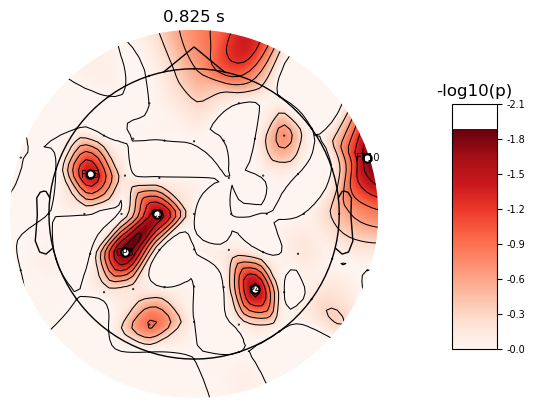

<Figure size 640x480 with 0 Axes>

In [441]:
plot_p_values(p_value_array[1],0.825,'late_neg.png')

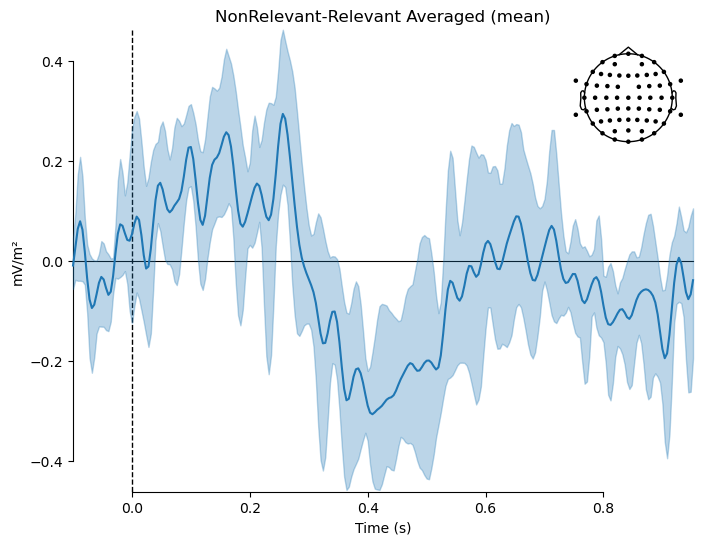

<Figure size 640x480 with 0 Axes>

In [461]:
contrast = 'NonRelevant-Relevant Averaged'
mne.viz.plot_compare_evokeds({contrast:diff_waves}, combine='mean',
                            legend=None,
                            show_sensors='upper right',
                            title=contrast
                            )
plt.show()

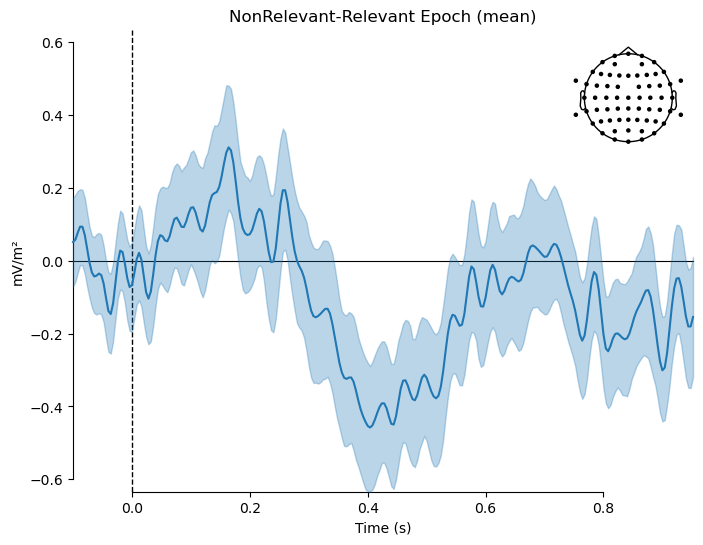

<Figure size 640x480 with 0 Axes>

In [462]:
contrast = 'NonRelevant-Relevant Epoch'
mne.viz.plot_compare_evokeds({contrast:epoch_differences}, combine='mean',
                            legend=None,
                            show_sensors='upper right',
                            title=contrast
                            )
plt.show()